In [1]:
import numpy as np
import cv2
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img 
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, SeparableConv2D, MaxPooling2D, Lambda
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.layers import Conv2DTranspose, Conv2D, add, concatenate
from tensorflow.keras.layers import LeakyReLU, Activation, Reshape
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam 
from tensorflow.keras.callbacks import ModelCheckpoint,ReduceLROnPlateau


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os


In [ ]:

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

discriminator = keras.Sequential(
    [
        keras.Input(shape=(64, 64, 3)),
        layers.Conv2D(64, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(128, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(128, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Flatten(),
        layers.Dropout(0.2),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)
discriminator.summary()


In [ ]:
# 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

latent_dim = 100

generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(8 * 8 * 128),
        layers.Reshape((8, 8, 128)),
        layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2DTranspose(256, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2DTranspose(512, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(3, kernel_size=5, padding="same", activation="sigmoid"),
    ],
    name="generator",
)
generator.summary()

In [ ]:
path = '/kaggle/input/rice-diseases-leaf-blast-classification/Rice Diseases (Leaf Blast Classification)/Rice Diseases (Leaf Blast Classification)/test/Browon Spot/'
dataset = keras.preprocessing.image_dataset_from_directory(
    path, label_mode=None, image_size=(224, 224), batch_size=32
)
dataset = dataset.map(lambda x: x / 255.0)

# Override train_step

In [ ]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(GAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # Assemble labels discriminating real from fake images
        labels = tf.concat(
            [tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis=0
        )
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Assemble labels that say "all real images"
        misleading_labels = tf.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

# Create a callback that periodically saves generated images


In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 255
        generated_images.numpy()
        for i in range(self.num_img):
            img = keras.preprocessing.image.array_to_img(generated_images[i])
            img.save("generated_img_%03d_%d.png" % (epoch, i))
            plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
            plt.show()

# Train the end-to-end model

 Adam optimizer with a learning rate of 0.002. This is as per the original research paper on DCGANs. 
 Link: https://arxiv.org/abs/1511.06434

In [ ]:
epochs = 35  # In practice, use ~100 epochs

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

gan.fit(
    dataset, epochs=epochs, callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim)]
)

In [ ]:
import PIL
# Display a single image using the epoch number
def display_image(epoch_no):
    return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

In [ ]:
# glob.glob('*.png')

In [ ]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

images = []
for img_path in glob.glob('*.png'):
    images.append(mpimg.imread(img_path))

plt.figure(figsize=(20,10))
columns = 20
for i, image in enumerate(images):
    plt.subplot(int(len(images) / columns + 1), columns, i + 1)
    plt.axis('off')
    #fig.tight_layout() 
    plt.imshow(image)

In [ ]:
def show_plot(examples, n):
    for i in range(n * n):
        plt.subplot(n, n, 1 + i)
        plt.axis('off')
        plt.imshow(examples[i, :, :, :])
    plt.show()

In [ ]:
from numpy.random import randn
# generate n_samples number of latent vectors as input for the generator
def generate_latent_points(latent_dim, n_samples):
    # generate points in the latent space
    x_input = randn(latent_dim * n_samples)
    # reshape into a batch of inputs for the network
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input

latent_points = generate_latent_points(latent_dim, 25)

In [ ]:
gan.predict()

In [ ]:
X = gan.predict(latent_points)
# scale from [-1,1] to [0,1]
X = (X + 1) / 2.0

import numpy as np
X = (X*255).astype(np.uint8)

# plot the result
show_plot(X, 5)

### tmp 2

In [2]:
tmp_path = "/kaggle/input/datasetfordcgan/train/Healthy Leaf/"

def load_real_images():
    datagen = ImageDataGenerator(rescale=1./255)
    X = datagen.flow_from_directory(tmp_path,
                                    target_size= (224,224),
                                    batch_size=32,
                                    class_mode='binary')
    data_list = []
    batch_index = 0
    while batch_index <= X.batch_index:
        data = X.next()
        data_list.append(data[0])
        batch_index += 1
    img_array = np.asarray(data_list)
    return img_array

In [3]:
dataset=load_real_images()

Found 1825 images belonging to 1 classes.


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:15: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  from ipykernel import kernelapp as app


In [4]:
dataset[0].shape

(32, 224, 224, 3)

In [5]:
TOTAL_EPOCHS = 50
BATCH_SIZE = 32
HALF_BATCH = BATCH_SIZE//2

# NO_OF_BATCHS = int(X_train.shape[0]/BATCH_SIZE)
NO_OF_BATCHES = len(dataset)
NOISE_DIM = 100

adam = keras.optimizers.Adam(learning_rate=2e-4, beta_1 = 0.5)

In [6]:
# Generator Model : Upsampling

generator = keras.Sequential()
generator.add(layers.Dense(units=7*7*128, input_shape=(NOISE_DIM,)))
generator.add(Reshape((7,7,128)))
generator.add(layers.LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())

# (7,7,128) -> (14,14,64)
generator.add(layers.Conv2DTranspose(64, kernel_size=(3,3), strides=(2,2), padding="same"))
generator.add(layers.LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())

# (7,7,128) -> (14,14,64)
generator.add(layers.Conv2DTranspose(128, kernel_size=(3,3), strides=(2,2), padding="same"))
generator.add(layers.LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())

generator.add(layers.Conv2DTranspose(256, kernel_size=(3,3), strides=(2,2), padding="same"))
generator.add(layers.LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())

generator.add(layers.Conv2DTranspose(512, kernel_size=(3,3), strides=(2,2), padding="same"))
generator.add(layers.LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())


generator.add(layers.Conv2DTranspose(3, kernel_size=(3,3), strides=(2,2), padding="same", activation='tanh'))

# generator.compile(loss=keras.losses.BinaryCrossentropy(), optimizer=adam, metrics=['accuracy'])

generator.summary()

2022-12-11 17:22:21.709122: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-11 17:22:21.815023: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-11 17:22:21.815815: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 6272)              633472    
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 128)         0         
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 7, 7, 128)         0         
_________________________________________________________________
batch_normalization (BatchNo (None, 7, 7, 128)         512       
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 14, 14, 64)        73792     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 14, 14, 64)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 14, 14, 64)        2

2022-12-11 17:22:21.818053: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-11 17:22:21.818374: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-11 17:22:21.819362: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-11 17:22:21.820339: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA 

In [7]:
# Discriminator Model -> Down Sampling
discriminator = keras.Sequential()
discriminator.add(layers.Conv2D(512, kernel_size=(3,3), strides=(2,2), padding="same", input_shape = (224, 224, 3)))
discriminator.add(layers.LeakyReLU(alpha=0.2))
# generator.add(BatchNormalization())

discriminator.add(layers.Conv2D(256, kernel_size=(3,3), strides=(2,2), padding="same"))
discriminator.add(layers.LeakyReLU(alpha=0.2))

discriminator.add(layers.Conv2D(128, kernel_size=(3,3), strides=(2,2), padding="same"))
discriminator.add(layers.LeakyReLU(alpha=0.2))

discriminator.add(layers.Conv2D(64, kernel_size=(3,3), strides=(2,2), padding="same"))
discriminator.add(layers.LeakyReLU(alpha=0.2))

discriminator.add(layers.Conv2D(128, kernel_size=(3,3), strides=(2,2), padding="same"))
discriminator.add(layers.LeakyReLU(alpha=0.2))


discriminator.add(layers.Flatten())
discriminator.add(layers.Dense(100))
discriminator.add(layers.LeakyReLU(alpha=0.2))
discriminator.add(layers.Dense(1, activation="sigmoid"))

discriminator.compile(loss=keras.losses.BinaryCrossentropy(), optimizer=adam, metrics=['accuracy'])

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 112, 112, 512)     14336     
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 112, 112, 512)     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 56, 56, 256)       1179904   
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 56, 56, 256)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 28, 28, 128)       295040    
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 28, 28, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 14, 14, 64)       

In [8]:
# Combined Model

discriminator.trainable = False
gan_input = Input(shape=(NOISE_DIM, ))
generated_img = generator(gan_input)
gan_output = discriminator(generated_img)

# Functional API

model = Model(gan_input, gan_output)
model.compile(loss=keras.losses.BinaryCrossentropy(), optimizer=adam, metrics=['accuracy'])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       2274627   
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 2264329   
Total params: 4,538,956
Trainable params: 2,272,451
Non-trainable params: 2,266,505
_________________________________________________________________


In [9]:
model.input_shape

(None, 100)

In [10]:
model.output_shape

(None, 1)

In [11]:
# def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=100, n_batch=128):
#     bat_per_epo = int(dataset.shape[0] / n_batch)
#     half_batch = int(n_batch / 2)  #the discriminator model is updated for a half batch of real samples 
#                             #and a half batch of fake samples, combined a single batch. 
#     # manually enumerate epochs and bacthes. 
#     for i in range(n_epochs):
#         # enumerate batches over the training set
#         for j in range(bat_per_epo):
            
#             # Train the discriminator on real and fake images, separately (half batch each)
#             #Research showed that separate training is more effective. 
#             # get randomly selected 'real' samples
#             X_real, y_real = generate_real_samples(dataset, half_batch)
#             # update discriminator model weights
#             ##train_on_batch allows you to update weights based on a collection 
#             #of samples you provide
#             #Let us just capture loss and ignore accuracy value (2nd output below)
#             d_loss_real, _ = d_model.train_on_batch(X_real, y_real) 
            
#             # generate 'fake' examples
#             X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
#             # update discriminator model weights
#             d_loss_fake, _ = d_model.train_on_batch(X_fake, y_fake)
            
#             #d_loss = 0.5 * np.add(d_loss_real, d_loss_fake) #Average loss if you want to report single..
            
#             # prepare points in latent space as input for the generator
#             X_gan = generate_latent_points(latent_dim, n_batch)
             
#             # The generator wants the discriminator to label the generated samples
#             # as valid (ones)
#             #This is where the generator is trying to trick discriminator into believing
#             #the generated image is true (hence value of 1 for y)			
#             y_gan = ones((n_batch, 1))
            
#             # Generator is part of combined model where it got directly linked with the discriminator
#             # Train the generator with latent_dim as x and 1 as y. 
#             # Again, 1 as the output as it is adversarial and if generator did a great
#             #job of folling the discriminator then the output would be 1 (true)
#             # update the generator via the discriminator's error
#             g_loss = gan_model.train_on_batch(X_gan, y_gan)
            
#             # Print losses on this batch
#             print('Epoch>%d, Batch %d/%d, d1=%.3f, d2=%.3f g=%.3f' % (i+1, j+1, bat_per_epo, d_loss_real, d_loss_fake, g_loss))
#     # save the generator model
#     g_model.save('cifar_generator_2epochs.h5')


In [12]:

def display_images(samples = 10):
    noise = np.random.normal(0,1,size=(HALF_BATCH, NOISE_DIM))
    
    generated_img = generator.predict(noise)
    
    plt.figure(figsize = (10,10))
    for i in range(samples):
        plt.subplot(5,5,i+1)
        plt.imshow(generated_img[i])
        plt.axis('off')
    
    plt.show()

In [13]:
# plt.imshow(real_imgs[3])

2022-12-11 17:22:25.029117: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-12-11 17:22:27.035269: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1, Disc loss 0.05263887664880096, Generator loss 0.06541098822868151
Epoch 2, Disc loss 5.250405094488804e-10, Generator loss 0.0004595955389576327
Epoch 3, Disc loss 5.423588228136292e-10, Generator loss 0.00025116775354386815
Epoch 4, Disc loss 4.2768565808753697e-10, Generator loss 0.00016733954646297846
Epoch 5, Disc loss 5.493727015704358e-10, Generator loss 0.00012253358765615543
Epoch 6, Disc loss 6.60213043575058e-10, Generator loss 9.364023316537209e-05
Epoch 7, Disc loss 1.5138438406033417e-07, Generator loss 8.345674902094495e-05
Epoch 8, Disc loss 1.0694077546996291e-06, Generator loss 0.0009636122775733831
Epoch 9, Disc loss 6.157432224197697, Generator loss 8.959550433003434
Epoch 10, Disc loss 8.655507643800564e-07, Generator loss 0.00033444600800673185


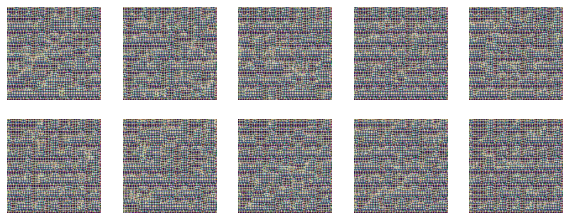

Epoch 11, Disc loss 0.004623107429856172, Generator loss 0.10322630919056346
Epoch 12, Disc loss 1.1265850295958395, Generator loss 27.557287856152183
Epoch 13, Disc loss 0.01809437715539325, Generator loss 2.5627376740438894
Epoch 14, Disc loss 0.2285838583387018, Generator loss 2.817201036110259
Epoch 15, Disc loss 0.16926388082164953, Generator loss 2.310724268879807
Epoch 16, Disc loss 0.27036420307571496, Generator loss 2.7186827440010872
Epoch 17, Disc loss 0.7178839340544584, Generator loss 1.2737394341251307
Epoch 18, Disc loss 0.6657284919107169, Generator loss 0.7036248884702984
Epoch 19, Disc loss 0.680837180007968, Generator loss 0.7364266818029839
Epoch 20, Disc loss 0.675807305595331, Generator loss 0.7428271498596459


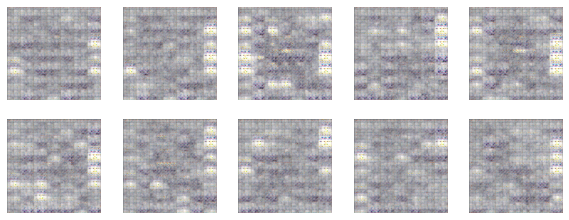

Epoch 21, Disc loss 0.6551672230687058, Generator loss 0.887711575156764
Epoch 22, Disc loss 0.46185928779213054, Generator loss 1.6766494606670581
Epoch 23, Disc loss 0.5284647333778834, Generator loss 1.8354799255990146
Epoch 24, Disc loss 0.7418580609455443, Generator loss 1.041973496738233
Epoch 25, Disc loss 0.7026549148977849, Generator loss 0.9408968875282689
Epoch 26, Disc loss 0.5336996445007491, Generator loss 1.2156477319566827
Epoch 27, Disc loss 0.5071335617910352, Generator loss 1.1565958295474972
Epoch 28, Disc loss 0.3744079802969569, Generator loss 2.3338921007357145
Epoch 29, Disc loss 0.4146466650101438, Generator loss 1.6869685785812245
Epoch 30, Disc loss 0.15051029677290403, Generator loss 2.7610761261822883


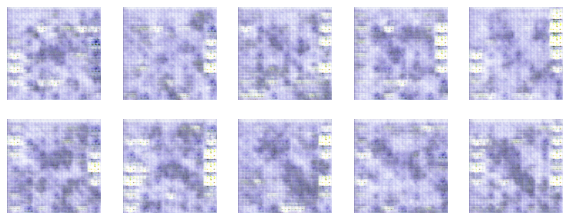

Epoch 31, Disc loss 0.17433464784245875, Generator loss 3.3468082620386492
Epoch 32, Disc loss 0.04896434093276631, Generator loss 3.6981030848988317
Epoch 33, Disc loss 0.6292324688842232, Generator loss 3.4312542300475273
Epoch 34, Disc loss 0.11305909685300146, Generator loss 2.52972370072415
Epoch 35, Disc loss 0.6111610325667696, Generator loss 3.681955046821059
Epoch 36, Disc loss 0.3358197479525156, Generator loss 1.9191035272782309
Epoch 37, Disc loss 0.05499307160049252, Generator loss 3.3464387299721703
Epoch 38, Disc loss 0.19827368289483466, Generator loss 3.458871191008049
Epoch 39, Disc loss 0.10754644505871974, Generator loss 1.9263317017987567
Epoch 40, Disc loss 0.07766132682496518, Generator loss 3.830438546967088


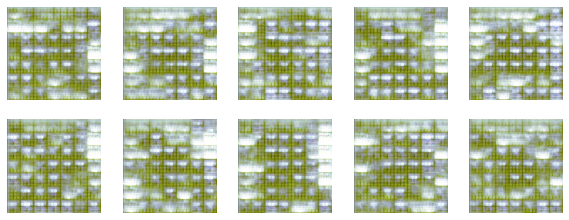

Epoch 41, Disc loss 0.1446953933703123, Generator loss 3.877691926663382
Epoch 42, Disc loss 0.010642625063349186, Generator loss 4.5997762847365
Epoch 43, Disc loss 0.0038609687063247597, Generator loss 2.399926131558523
Epoch 44, Disc loss 0.14460956855810042, Generator loss 1.78723508802553
Epoch 45, Disc loss 0.11171927695369177, Generator loss 3.1566195968996014
Epoch 46, Disc loss 0.006803606604227826, Generator loss 1.85035247656337
Epoch 47, Disc loss 0.03546382080825351, Generator loss 0.18087403770544352
Epoch 48, Disc loss 0.12808512931375027, Generator loss 3.696591082167926
Epoch 49, Disc loss 0.029187626914088532, Generator loss 3.6521608160253156
Epoch 50, Disc loss 0.03177844512735742, Generator loss 1.6490311389298815


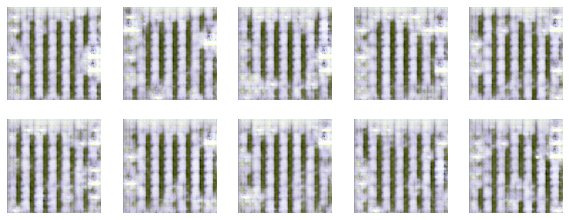

Epoch 51, Disc loss 0.01945517243915736, Generator loss 4.3050166305742765
Epoch 52, Disc loss 0.001910745702503435, Generator loss 6.080547031603362
Epoch 53, Disc loss 0.0032429286976424125, Generator loss 5.1076456203795315
Epoch 54, Disc loss 0.002852918653234569, Generator loss 2.9897374207513376
Epoch 55, Disc loss 0.0023999205654143606, Generator loss 2.1811073223749795
Epoch 56, Disc loss 0.04441124665706406, Generator loss 5.035227187892847
Epoch 57, Disc loss 0.11053372534849004, Generator loss 1.8828417786842278
Epoch 58, Disc loss 0.0071286192583356394, Generator loss 6.326668576190346
Epoch 59, Disc loss 0.0043942941014565775, Generator loss 4.461662712850068
Epoch 60, Disc loss 0.348111369626297, Generator loss 3.1578163117693183


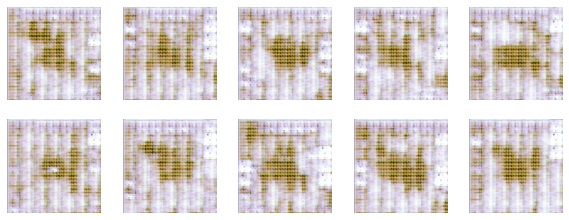

Epoch 61, Disc loss 0.19280568175957324, Generator loss 3.2616209168183175
Epoch 62, Disc loss 0.007645499337565541, Generator loss 4.980602879273264
Epoch 63, Disc loss 0.001014686937253965, Generator loss 1.6415566268720125
Epoch 64, Disc loss 0.0009200919013858895, Generator loss 0.3671849728153463
Epoch 65, Disc loss 0.0005751630770223119, Generator loss 0.09028301871659462
Epoch 66, Disc loss 0.00024780880034079117, Generator loss 0.0692653674305531
Epoch 67, Disc loss 1.485061825574937, Generator loss 2.706019306816814
Epoch 68, Disc loss 0.11880203918962363, Generator loss 2.9476606553060964
Epoch 69, Disc loss 0.19973901984191975, Generator loss 3.0937287577411583
Epoch 70, Disc loss 0.026302299073186555, Generator loss 3.7071780865652517


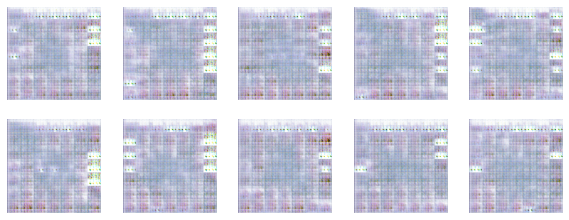

Epoch 71, Disc loss 0.06216262587271419, Generator loss 4.117786528771384
Epoch 72, Disc loss 0.13092900362052637, Generator loss 3.5739649949889434
Epoch 73, Disc loss 0.026539852933271043, Generator loss 0.006300733452039901
Epoch 74, Disc loss 0.01341073022312581, Generator loss 0.014226814409260425
Epoch 75, Disc loss 1.9811469001606508, Generator loss 12.330387121197163
Epoch 76, Disc loss 0.23506463392486535, Generator loss 2.3780879953451324
Epoch 77, Disc loss 0.1628967875143995, Generator loss 1.6119186572792752
Epoch 78, Disc loss 0.0036360543808928412, Generator loss 0.006579312779019605
Epoch 79, Disc loss 0.6196239143521923, Generator loss 2.5697946185661595
Epoch 80, Disc loss 0.25938880835708816, Generator loss 2.0994997651953446


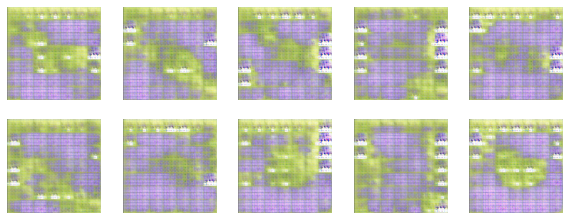

Epoch 81, Disc loss 0.22253705136347235, Generator loss 1.759785670460316
Epoch 82, Disc loss 0.23665414441769062, Generator loss 0.22368774224856966
Epoch 83, Disc loss 0.06683305369918807, Generator loss 0.2394988897926452
Epoch 84, Disc loss 0.669425793269878, Generator loss 1.6569784231353224
Epoch 85, Disc loss 0.38433384392083736, Generator loss 1.529889096293533
Epoch 86, Disc loss 0.5200579191901182, Generator loss 1.6044997698382328
Epoch 87, Disc loss 0.510002851551562, Generator loss 1.1032001880700129
Epoch 88, Disc loss 0.45887869547464344, Generator loss 1.3849991680237286
Epoch 89, Disc loss 0.18456498952225064, Generator loss 3.258376526989435
Epoch 90, Disc loss 0.12161282767264263, Generator loss 4.225387970606486


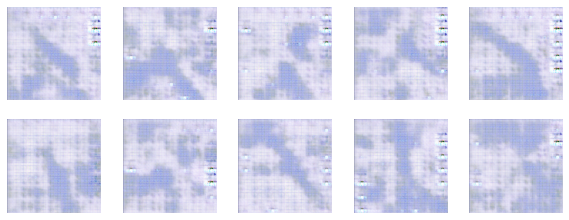

Epoch 91, Disc loss 0.011873064961472815, Generator loss 5.020819747657106
Epoch 92, Disc loss 0.10984591078476887, Generator loss 4.269017828138251
Epoch 93, Disc loss 0.08211269286410945, Generator loss 3.8985833065551625
Epoch 94, Disc loss 0.5198036525316798, Generator loss 1.0101961357551708
Epoch 95, Disc loss 0.06539425638981618, Generator loss 3.663497908073559
Epoch 96, Disc loss 0.16041547003330556, Generator loss 4.073161577969267
Epoch 97, Disc loss 0.018288610804690682, Generator loss 4.297615569934511
Epoch 98, Disc loss 0.005531987848485935, Generator loss 5.313500580034758
Epoch 99, Disc loss 0.0016694494081407154, Generator loss 6.229470303184108
Epoch 100, Disc loss 0.026427844935903187, Generator loss 7.083550085101211


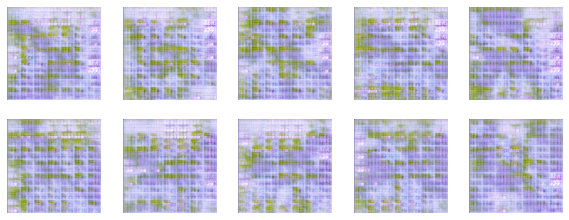

Epoch 101, Disc loss 0.23946013542572392, Generator loss 3.6654725597615827
Epoch 102, Disc loss 0.34215660876872245, Generator loss 2.9204625184075876
Epoch 103, Disc loss 0.01883898491364801, Generator loss 4.269720374492177
Epoch 104, Disc loss 0.006682635197472728, Generator loss 4.715030025821506
Epoch 105, Disc loss 0.006757524176592007, Generator loss 0.02293101899334017
Epoch 106, Disc loss 0.011054455620644763, Generator loss 0.012080617735097022
Epoch 107, Disc loss 4.2329397686257195, Generator loss 10.796563798822493
Epoch 108, Disc loss 0.2613120984521964, Generator loss 5.422924096124214
Epoch 109, Disc loss 0.26722751920756865, Generator loss 3.0700889470284447
Epoch 110, Disc loss 0.6262124961144045, Generator loss 0.7084098381823615


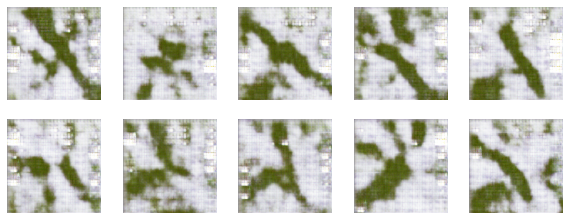

Epoch 111, Disc loss 0.4239472742927702, Generator loss 0.5054049812126578
Epoch 112, Disc loss 0.43993719551189425, Generator loss 0.5828525891952347
Epoch 113, Disc loss 0.42765677190924944, Generator loss 0.8026965002349594
Epoch 114, Disc loss 0.40596733229202137, Generator loss 0.7397716441436818
Epoch 115, Disc loss 0.4363341694207568, Generator loss 1.0947823272201054
Epoch 116, Disc loss 0.407622053884488, Generator loss 1.9210017292123092
Epoch 117, Disc loss 0.3722833022267415, Generator loss 3.3401870434744314
Epoch 118, Disc loss 0.4588192864893037, Generator loss 2.5706049517581335
Epoch 119, Disc loss 0.5713301344791002, Generator loss 2.0219849870916
Epoch 120, Disc loss 0.49735548412590697, Generator loss 1.6483780041075589


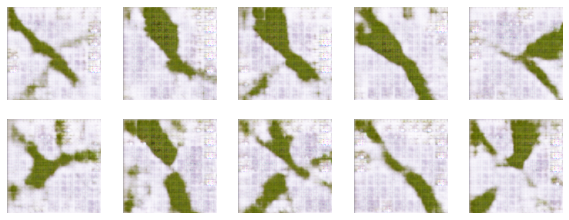

Epoch 121, Disc loss 0.5113955330299703, Generator loss 1.3621034460109578
Epoch 122, Disc loss 0.4648402095363851, Generator loss 1.1434831682004427
Epoch 123, Disc loss 0.46408905562732305, Generator loss 1.1652555057876988
Epoch 124, Disc loss 0.4955015135438819, Generator loss 1.341043800638433
Epoch 125, Disc loss 0.4788436290987751, Generator loss 1.5197592356748748
Epoch 126, Disc loss 0.4367801562735909, Generator loss 1.6406781192411457
Epoch 127, Disc loss 0.4956890199529497, Generator loss 1.7693559328715007
Epoch 128, Disc loss 0.4321272230069888, Generator loss 1.8432320774647228
Epoch 129, Disc loss 0.396291918791177, Generator loss 2.045674598007871
Epoch 130, Disc loss 0.36088093808084204, Generator loss 2.1207915419026424


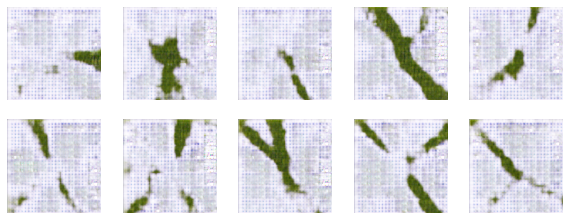

Epoch 131, Disc loss 0.36625626055817856, Generator loss 2.1136708698774638
Epoch 132, Disc loss 0.32051057902801977, Generator loss 2.687867986528497
Epoch 133, Disc loss 0.3245853447731127, Generator loss 2.7846114468156244
Epoch 134, Disc loss 0.24494490618899203, Generator loss 3.0040483432903624
Epoch 135, Disc loss 0.27418179715280994, Generator loss 3.2751549712398598
Epoch 136, Disc loss 0.22867309373983166, Generator loss 3.1125796949654294
Epoch 137, Disc loss 0.253633527297592, Generator loss 3.4767304428836754
Epoch 138, Disc loss 0.24013792960536912, Generator loss 3.92293886134499
Epoch 139, Disc loss 0.2259075112085332, Generator loss 3.7225103796574106
Epoch 140, Disc loss 0.38286101762940616, Generator loss 3.46534530321757


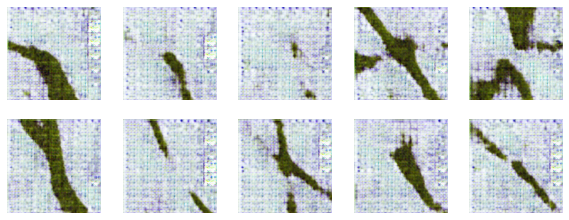

Epoch 141, Disc loss 0.20890624837525057, Generator loss 3.4313202991820217
Epoch 142, Disc loss 0.21628087536807647, Generator loss 3.4449917893660698
Epoch 143, Disc loss 0.2269234345784705, Generator loss 3.668699214332982
Epoch 144, Disc loss 0.2268354217766931, Generator loss 3.6594940946813215
Epoch 145, Disc loss 0.20981992884097914, Generator loss 3.626725774062307
Epoch 146, Disc loss 0.21881879281187266, Generator loss 3.67890619395072
Epoch 147, Disc loss 0.22156115249616273, Generator loss 3.6159164612753347
Epoch 148, Disc loss 0.20124065767965493, Generator loss 3.8182783921559653
Epoch 149, Disc loss 0.2515994721141301, Generator loss 3.5342279484397485
Epoch 150, Disc loss 0.24926395228197962, Generator loss 3.404119332631429


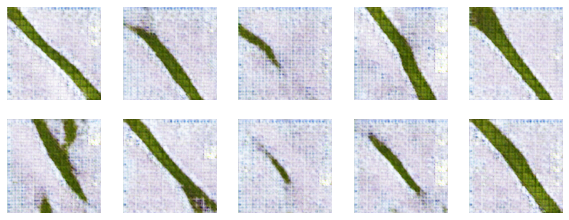

Epoch 151, Disc loss 0.25293492985758603, Generator loss 3.343866557405706
Epoch 152, Disc loss 0.2325713231734801, Generator loss 3.37466792056435
Epoch 153, Disc loss 0.24368569099654755, Generator loss 3.4894312745646427
Epoch 154, Disc loss 0.22284416378508404, Generator loss 3.4735527247713325
Epoch 155, Disc loss 0.25648176691315155, Generator loss 3.395883585277357
Epoch 156, Disc loss 0.24117648660352356, Generator loss 3.257334742629737
Epoch 157, Disc loss 0.23320325892091842, Generator loss 3.052532099840934
Epoch 158, Disc loss 0.29301214446885543, Generator loss 3.1759061478731927
Epoch 159, Disc loss 0.254781919907321, Generator loss 2.8182587958218757
Epoch 160, Disc loss 0.2679802467883156, Generator loss 2.9033778717643335


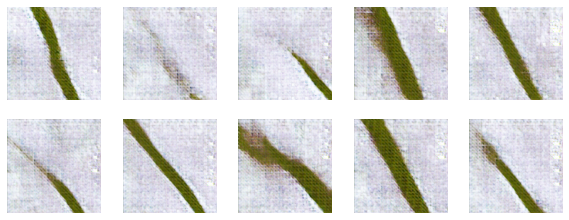

Epoch 161, Disc loss 0.26307750437735467, Generator loss 2.984546661376953
Epoch 162, Disc loss 0.25655555651572187, Generator loss 2.8771070074616816
Epoch 163, Disc loss 0.25244291918352246, Generator loss 3.093989221673263
Epoch 164, Disc loss 0.25850697850252974, Generator loss 2.915530744351839
Epoch 165, Disc loss 0.2523920377879812, Generator loss 2.8518712917963662
Epoch 166, Disc loss 0.23942766759315864, Generator loss 3.4247703175795707
Epoch 167, Disc loss 0.23840992777657352, Generator loss 2.922545361937138
Epoch 168, Disc loss 14.907840338655891, Generator loss 9.629316217282362
Epoch 169, Disc loss 0.10844667463798512, Generator loss 0.936101981877041
Epoch 170, Disc loss 0.0887849774438612, Generator loss 1.3878085662589383


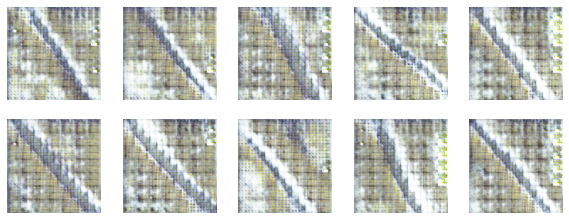

Epoch 171, Disc loss 0.20721304610037405, Generator loss 3.591475430287813
Epoch 172, Disc loss 0.03381760844684067, Generator loss 3.8187541250596966
Epoch 173, Disc loss 0.13200049454041873, Generator loss 3.745722227974942
Epoch 174, Disc loss 0.2998423042045791, Generator loss 3.3809331530018856
Epoch 175, Disc loss 0.4393428658511032, Generator loss 2.6358066713600827
Epoch 176, Disc loss 0.3644466042404243, Generator loss 2.132206918900473
Epoch 177, Disc loss 0.370975604349249, Generator loss 1.5699481943197418
Epoch 178, Disc loss 0.3839317404321934, Generator loss 1.4510562231666164
Epoch 179, Disc loss 0.40710456090930264, Generator loss 1.5725456444840682
Epoch 180, Disc loss 0.3865393822065048, Generator loss 1.6710771677786844


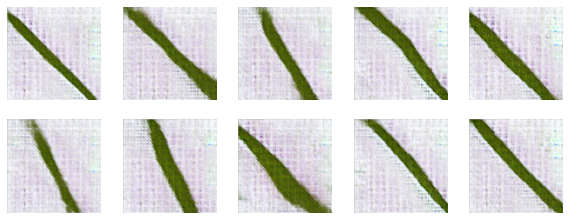

Epoch 181, Disc loss 0.3797577852219866, Generator loss 1.7328853565349913
Epoch 182, Disc loss 0.40283870033658387, Generator loss 1.7149330774943035
Epoch 183, Disc loss 0.36965662316141423, Generator loss 1.8017002218648006
Epoch 184, Disc loss 0.3812502397779833, Generator loss 1.805143157641093
Epoch 185, Disc loss 0.39855496075592545, Generator loss 1.7902865869957103
Epoch 186, Disc loss 0.38150637400777715, Generator loss 1.7487525563491018
Epoch 187, Disc loss 0.40369261794707234, Generator loss 1.6679348610995108
Epoch 188, Disc loss 0.3978386852694185, Generator loss 1.677435743181329
Epoch 189, Disc loss 0.4031960959627963, Generator loss 1.7451300014529312
Epoch 190, Disc loss 0.4090300021987212, Generator loss 1.720881319882577


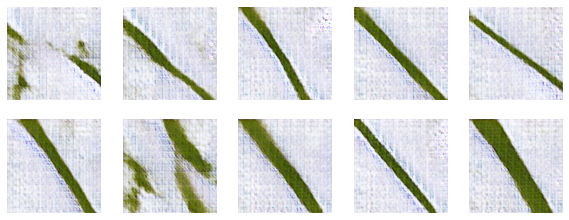

Epoch 191, Disc loss 0.38996926322579384, Generator loss 1.739522093220761
Epoch 192, Disc loss 0.40910933598091725, Generator loss 1.6921617859288265
Epoch 193, Disc loss 0.39829845582706885, Generator loss 1.7608680474130731
Epoch 194, Disc loss 0.3886000326458822, Generator loss 1.8083778536110593
Epoch 195, Disc loss 0.3895138652439703, Generator loss 1.7661870968969244
Epoch 196, Disc loss 0.39049769176595045, Generator loss 1.7801641278099596
Epoch 197, Disc loss 0.4098043594705431, Generator loss 1.6805955819916307
Epoch 198, Disc loss 0.39018343951095613, Generator loss 1.7733348566189147
Epoch 199, Disc loss 0.4138582012403691, Generator loss 1.7103425808120192
Epoch 200, Disc loss 0.39897980024678664, Generator loss 1.8185698107669228


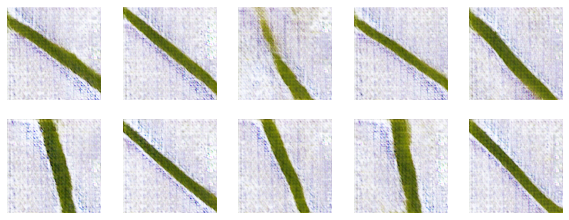

Epoch 201, Disc loss 0.41187993606977297, Generator loss 1.6334070657428943
Epoch 202, Disc loss 0.436848127136105, Generator loss 1.5551800037685193
Epoch 203, Disc loss 0.41502921557740163, Generator loss 1.6138146718343098
Epoch 204, Disc loss 0.42455190629289863, Generator loss 1.646923776258502
Epoch 205, Disc loss 0.4036144777609591, Generator loss 1.8088360857545285
Epoch 206, Disc loss 0.40368612600784554, Generator loss 1.8107202994196039
Epoch 207, Disc loss 0.38317831762527166, Generator loss 1.9303780229468095
Epoch 208, Disc loss 0.37440745473692294, Generator loss 2.0791659062368826
Epoch 209, Disc loss 0.37082834963343647, Generator loss 2.132453905908685
Epoch 210, Disc loss 0.4133598143071459, Generator loss 2.240255360017743


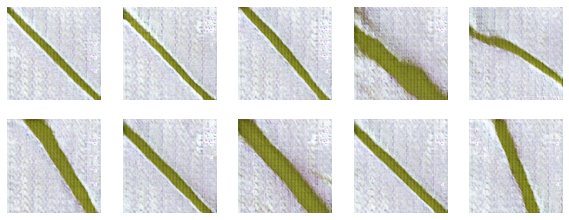

Epoch 211, Disc loss 0.3921393823336091, Generator loss 1.8466371402405857
Epoch 212, Disc loss 0.3884143562529955, Generator loss 1.9741201128876
Epoch 213, Disc loss 0.3853939253379378, Generator loss 1.958927215191356
Epoch 214, Disc loss 0.4124627094389054, Generator loss 2.0335155746393037
Epoch 215, Disc loss 0.4200136089664802, Generator loss 1.7842469738240827
Epoch 216, Disc loss 0.38247276038715716, Generator loss 2.050160704997548
Epoch 217, Disc loss 0.36413923193488207, Generator loss 2.3913076697734366
Epoch 218, Disc loss 0.39896695080556366, Generator loss 1.6978947426143445
Epoch 219, Disc loss 0.37901102097933753, Generator loss 2.052334109942118
Epoch 220, Disc loss 0.38536428120967586, Generator loss 2.0938949752272222


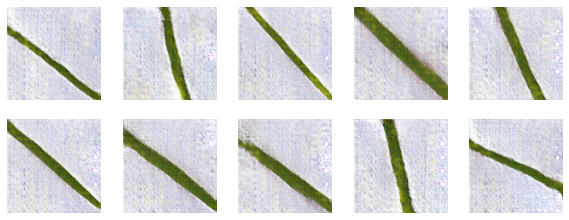

Epoch 221, Disc loss 0.34447807936291946, Generator loss 2.520769470616391
Epoch 222, Disc loss 0.41155863559821193, Generator loss 2.3132347349534954
Epoch 223, Disc loss 0.4158923810249881, Generator loss 1.6786144992761445
Epoch 224, Disc loss 0.3299349434673786, Generator loss 2.2856873545730325
Epoch 225, Disc loss 0.25430000075057413, Generator loss 3.0283565270273307
Epoch 226, Disc loss 0.4101573204327571, Generator loss 2.2871724471711277
Epoch 227, Disc loss 0.3169065637742741, Generator loss 2.6068830406456662
Epoch 228, Disc loss 0.34843614467893513, Generator loss 2.625269141113549
Epoch 229, Disc loss 0.30571267280008707, Generator loss 2.927219403417487
Epoch 230, Disc loss 0.3089795458996505, Generator loss 2.863368841639736


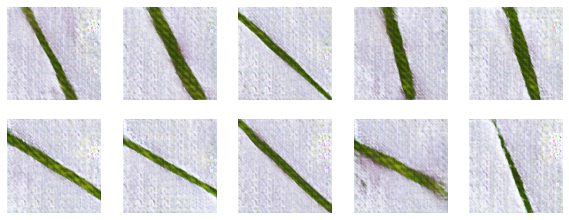

Epoch 231, Disc loss 0.3025213538325931, Generator loss 2.999517658300567
Epoch 232, Disc loss 0.2701440039499287, Generator loss 3.2381913620128966
Epoch 233, Disc loss 0.2760168439626955, Generator loss 3.089408518975241
Epoch 234, Disc loss 0.33303516220889595, Generator loss 2.810541219878615
Epoch 235, Disc loss 0.3310620051138757, Generator loss 3.0947329349685133
Epoch 236, Disc loss 0.23465445391392628, Generator loss 3.1555593850319847
Epoch 237, Disc loss 0.2553361144423354, Generator loss 3.3235393365224204
Epoch 238, Disc loss 0.3601335265526646, Generator loss 2.5753046106873896
Epoch 239, Disc loss 0.31663299528391736, Generator loss 2.8325257238588835
Epoch 240, Disc loss 0.3076553812675309, Generator loss 2.5863114009823716


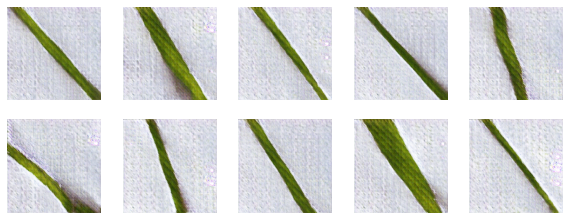

Epoch 241, Disc loss 0.2691051666869929, Generator loss 2.9433364868164062
Epoch 242, Disc loss 8.691038938200467, Generator loss 3.742133912821469
Epoch 243, Disc loss 0.745260431186149, Generator loss 1.3523227282914154
Epoch 244, Disc loss 0.6514196482143904, Generator loss 1.290432401916437
Epoch 245, Disc loss 0.5638086181460765, Generator loss 1.2759274819441009
Epoch 246, Disc loss 0.5293954355936301, Generator loss 1.3180177337244938
Epoch 247, Disc loss 0.5259235882968233, Generator loss 1.3050477452445448
Epoch 248, Disc loss 0.5102164187190825, Generator loss 1.2394834558169048
Epoch 249, Disc loss 0.5075453859672212, Generator loss 1.3032939475879335
Epoch 250, Disc loss 0.4731494652336104, Generator loss 1.3861310806190759


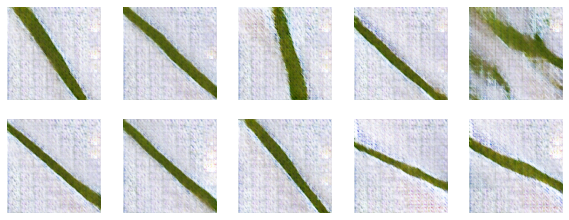

Epoch 251, Disc loss 0.5162573116913176, Generator loss 1.3596386376180147
Epoch 252, Disc loss 0.45843859585492236, Generator loss 1.4183626802344071
Epoch 253, Disc loss 0.4491052672005536, Generator loss 1.6330152216710543
Epoch 254, Disc loss 0.41828852522660764, Generator loss 1.6399645292968081
Epoch 255, Disc loss 0.4556756667923509, Generator loss 1.6484695045571578
Epoch 256, Disc loss 0.43434684749758035, Generator loss 1.5201442639033
Epoch 257, Disc loss 0.37640448515875297, Generator loss 1.83249172620606
Epoch 258, Disc loss 0.4440831059688016, Generator loss 1.6707970343138043
Epoch 259, Disc loss 0.39850832214742377, Generator loss 1.8040058675565218
Epoch 260, Disc loss 0.3964082741162233, Generator loss 1.8640783732397515


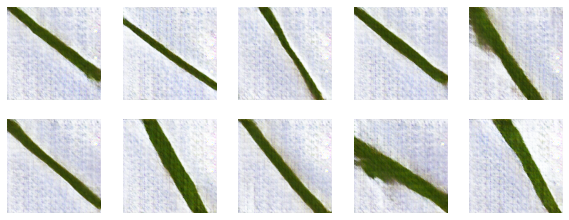

Epoch 261, Disc loss 0.38675516216378464, Generator loss 2.106166044871012
Epoch 262, Disc loss 0.4285738354450778, Generator loss 1.969307497928017
Epoch 263, Disc loss 0.3642530920997001, Generator loss 2.169489053257725
Epoch 264, Disc loss 0.5468026165638054, Generator loss 2.2636269006812784
Epoch 265, Disc loss 0.40290498387133866, Generator loss 1.754204555561668
Epoch 266, Disc loss 0.40263681015685987, Generator loss 1.7602665633486028
Epoch 267, Disc loss 0.3982393665141181, Generator loss 1.9193364632757086
Epoch 268, Disc loss 0.37646663371931044, Generator loss 1.8875275285620439
Epoch 269, Disc loss 0.3624650709853883, Generator loss 2.0569201603270413
Epoch 270, Disc loss 0.3430536223019947, Generator loss 2.193748664437679


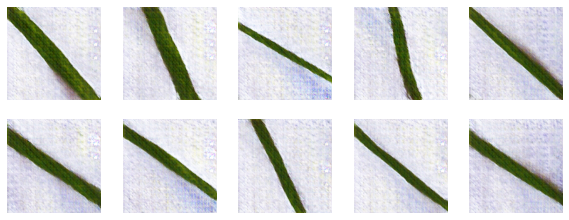

Epoch 271, Disc loss 0.35740246705449463, Generator loss 2.267699208175927
Epoch 272, Disc loss 0.3682920672653014, Generator loss 2.1201031960939107
Epoch 273, Disc loss 0.37140542994204323, Generator loss 1.952704197482059
Epoch 274, Disc loss 0.3594774260071286, Generator loss 2.3061713377634683
Epoch 275, Disc loss 0.33505966920015534, Generator loss 2.3953857191821983
Epoch 276, Disc loss 0.0467077032142013, Generator loss 5.4440843933507015
Epoch 277, Disc loss 0.043407373077683435, Generator loss 1.944397578079293
Epoch 278, Disc loss 0.03522226422313031, Generator loss 2.418522821849604
Epoch 279, Disc loss 0.19980646319651751, Generator loss 1.805202687624842
Epoch 280, Disc loss 0.2718230740308667, Generator loss 3.385328196642692


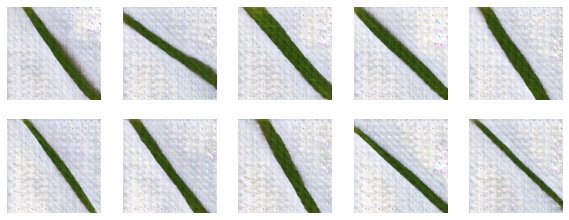

Epoch 281, Disc loss 0.2332685800563348, Generator loss 1.1320813067192048
Epoch 282, Disc loss 0.039963217848069915, Generator loss 3.753417466816149
Epoch 283, Disc loss 0.009253629883204937, Generator loss 4.802238696499875
Epoch 284, Disc loss 0.0030005900440513464, Generator loss 0.11007465554499313
Epoch 285, Disc loss 0.01068310040512294, Generator loss 1.289881628977335
Epoch 286, Disc loss 0.06362355717933353, Generator loss 1.9287424250546712
Epoch 287, Disc loss 0.24156855154586465, Generator loss 3.110482138499879
Epoch 288, Disc loss 0.14742447463581093, Generator loss 3.7496546968621645
Epoch 289, Disc loss 0.14270292171644733, Generator loss 1.0943938637315194
Epoch 290, Disc loss 0.009540404847189564, Generator loss 4.191555152859604


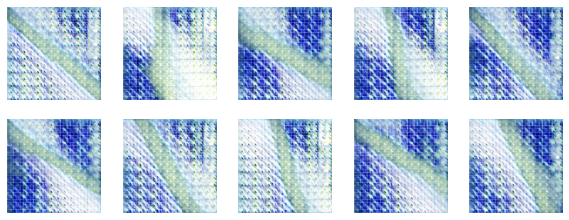

Epoch 291, Disc loss 0.007568158238380998, Generator loss 7.115421679981968
Epoch 292, Disc loss 0.004243075909340483, Generator loss 4.837849304771736
Epoch 293, Disc loss 4.808197768510484, Generator loss 11.253588088471396
Epoch 294, Disc loss 2.04725519545109, Generator loss 56.58235289966851
Epoch 295, Disc loss 0.0890211567625636, Generator loss 4.355799120769166
Epoch 296, Disc loss 0.09223438888777405, Generator loss 1.2501039322008167
Epoch 297, Disc loss 0.03840934328738449, Generator loss 0.18093858884745523
Epoch 298, Disc loss 0.15089965701505825, Generator loss 2.177300291560721
Epoch 299, Disc loss 0.2783293137188657, Generator loss 4.025479179725313
Epoch 300, Disc loss 0.1929754830627261, Generator loss 3.5625436849761427


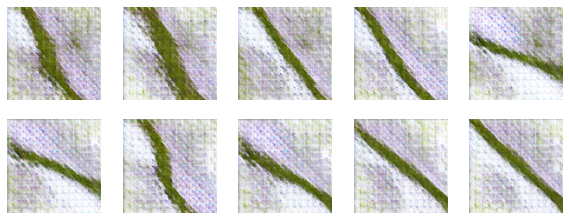

Epoch 301, Disc loss 0.2757828005695748, Generator loss 3.57075596064852
Epoch 302, Disc loss 0.24029625383646866, Generator loss 3.226989375917535
Epoch 303, Disc loss 0.2950580246713862, Generator loss 2.7799385472347864
Epoch 304, Disc loss 0.32370348400518034, Generator loss 2.723327684820744
Epoch 305, Disc loss 0.2870844781170027, Generator loss 2.7384780206178365
Epoch 306, Disc loss 0.2790016450167617, Generator loss 2.7969989964836524
Epoch 307, Disc loss 0.2704533054329978, Generator loss 2.9555726260469672
Epoch 308, Disc loss 0.22974843123372188, Generator loss 3.2932425549155786
Epoch 309, Disc loss 0.28970851910120826, Generator loss 3.1354114319148816
Epoch 310, Disc loss 0.28345553380878347, Generator loss 2.9410980584328636


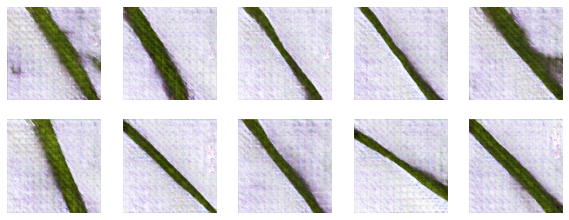

Epoch 311, Disc loss 0.2962093414052537, Generator loss 2.863493095364487
Epoch 312, Disc loss 0.273847047255881, Generator loss 2.9714440672021163
Epoch 313, Disc loss 0.2812746690153226, Generator loss 2.9121430401216473
Epoch 314, Disc loss 0.3370827715843916, Generator loss 2.8704655463235422
Epoch 315, Disc loss 0.3411419034134923, Generator loss 2.5025666617510613
Epoch 316, Disc loss 0.3339803776654758, Generator loss 2.5107885933758918
Epoch 317, Disc loss 0.3053621784375425, Generator loss 2.459146920003389
Epoch 318, Disc loss 0.3555645469510764, Generator loss 2.2613160191920767
Epoch 319, Disc loss 0.2965061182907799, Generator loss 2.381453459722954
Epoch 320, Disc loss 0.3502313342402902, Generator loss 2.4047701337881255


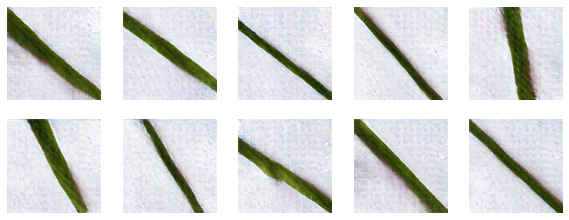

Epoch 321, Disc loss 0.35874835663197335, Generator loss 2.1459808328695464
Epoch 322, Disc loss 0.3190034576936772, Generator loss 2.36426529967994
Epoch 323, Disc loss 0.35078116666460246, Generator loss 2.340375783150656
Epoch 324, Disc loss 0.3219159057265834, Generator loss 2.336294278763888
Epoch 325, Disc loss 0.343089494527432, Generator loss 2.252108613650004
Epoch 326, Disc loss 0.31305293333635, Generator loss 2.4272253659733556
Epoch 327, Disc loss 0.2904900629726941, Generator loss 2.5891383238006056
Epoch 328, Disc loss 0.3291386149072072, Generator loss 2.4326815354196647
Epoch 329, Disc loss 0.30540490287699196, Generator loss 2.399121416242499
Epoch 330, Disc loss 0.3286947482183837, Generator loss 2.4951109509719047


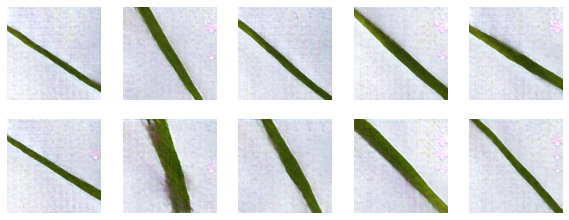

Epoch 331, Disc loss 0.3067466706331623, Generator loss 2.4428282244163646
Epoch 333, Disc loss 0.2757090600615923, Generator loss 2.569157730069077
Epoch 334, Disc loss 0.2890265363742385, Generator loss 2.856575560151485
Epoch 335, Disc loss 0.023597107825368942, Generator loss 4.293966515022412
Epoch 336, Disc loss 0.008211735469157384, Generator loss 4.83299398003963
Epoch 337, Disc loss 3.1985320308366507, Generator loss 9.412283414177569
Epoch 338, Disc loss 0.14868583515740816, Generator loss 0.5969395888006833
Epoch 339, Disc loss 0.20923085250588133, Generator loss 3.7541312657670924
Epoch 340, Disc loss 0.40278982982170164, Generator loss 3.0958619912465415


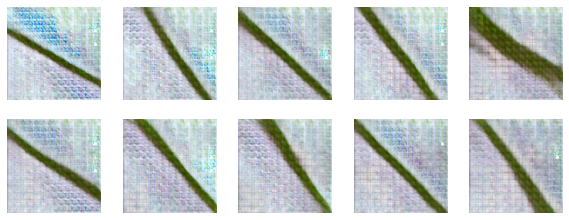

Epoch 341, Disc loss 0.40359543866821024, Generator loss 2.6186945647524116
Epoch 342, Disc loss 0.35008816917737323, Generator loss 2.6767886354212176
Epoch 343, Disc loss 0.030935114753355128, Generator loss 4.181274568825438
Epoch 344, Disc loss 0.022515001791559512, Generator loss 4.574282972436202
Epoch 345, Disc loss 0.01164129327225648, Generator loss 1.523911432305332
Epoch 346, Disc loss 0.0467586136322735, Generator loss 0.8746712919939391
Epoch 347, Disc loss 0.38308131262831585, Generator loss 3.1480900551143445
Epoch 348, Disc loss 0.4280888637887281, Generator loss 2.3975284036837126
Epoch 349, Disc loss 0.4019306846159069, Generator loss 2.139233534796196
Epoch 350, Disc loss 0.19900682657750798, Generator loss 3.1841285939802204


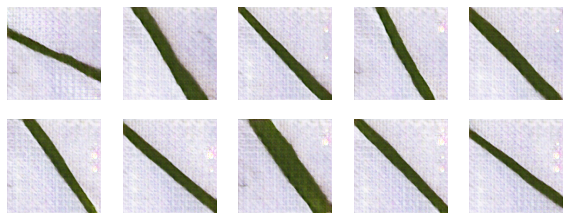

Epoch 351, Disc loss 0.35917940936071735, Generator loss 2.2843123465253594
Epoch 352, Disc loss 0.36549431020230577, Generator loss 2.275559166021514
Epoch 353, Disc loss 0.3587005706994157, Generator loss 2.249956576447738
Epoch 354, Disc loss 0.3154277979281911, Generator loss 2.3544632008201196
Epoch 355, Disc loss 0.3417466739029215, Generator loss 2.087948669467056
Epoch 356, Disc loss 0.04075950855373154, Generator loss 3.6162235193085253
Epoch 357, Disc loss 0.007283227558500863, Generator loss 4.479611639390912
Epoch 358, Disc loss 0.003933023082066312, Generator loss 4.979250556544254
Epoch 359, Disc loss 0.005821490636530794, Generator loss 0.9831526757201605
Epoch 360, Disc loss 0.0015945093466250544, Generator loss 0.06223262302381428


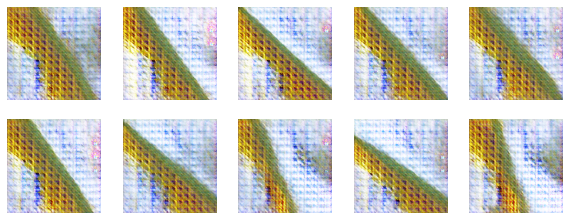

Epoch 361, Disc loss 0.025593197678400535, Generator loss 2.5166924876536716
Epoch 362, Disc loss 0.12035871209365978, Generator loss 1.3652548329871999
Epoch 363, Disc loss 0.08802495840429864, Generator loss 3.2567399112801803
Epoch 364, Disc loss 0.008534823225318858, Generator loss 5.037869399054008
Epoch 365, Disc loss 0.005084233992533253, Generator loss 4.974272297139754
Epoch 366, Disc loss 0.005258409921227195, Generator loss 1.0643997576349138
Epoch 367, Disc loss 0.3487621491070653, Generator loss 4.719141781297431
Epoch 368, Disc loss 0.23345432881800215, Generator loss 3.422192542176498
Epoch 369, Disc loss 0.09691469482181435, Generator loss 3.799540950540911
Epoch 370, Disc loss 0.006847071533439032, Generator loss 4.91583560224165


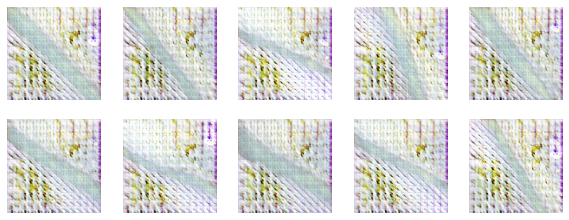

Epoch 371, Disc loss 0.06092697481932529, Generator loss 5.173071367069752
Epoch 372, Disc loss 0.00621681742391689, Generator loss 0.0020531897137340835
Epoch 373, Disc loss 0.008640902990676394, Generator loss 1.2432819172717835
Epoch 374, Disc loss 0.13315602559853437, Generator loss 1.7076948266180247
Epoch 375, Disc loss 0.07806415454919054, Generator loss 0.6297707931612023
Epoch 376, Disc loss 0.447980214535265, Generator loss 10.141584772812692
Epoch 377, Disc loss 0.21662320489037337, Generator loss 4.540395049130619
Epoch 378, Disc loss 0.02409804402499184, Generator loss 1.3453079206151315
Epoch 379, Disc loss 0.039715037311910645, Generator loss 1.0853421966343089
Epoch 380, Disc loss 0.17696073138347274, Generator loss 6.103497852358902


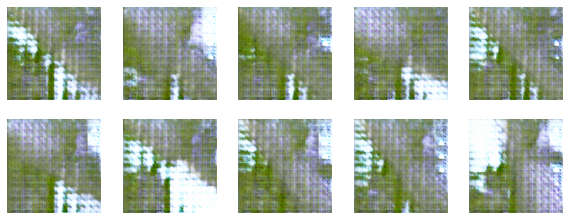

Epoch 381, Disc loss 0.06707405531285807, Generator loss 4.846431429971728
Epoch 382, Disc loss 0.04618632167878392, Generator loss 5.312117340271933
Epoch 383, Disc loss 0.07593619746219167, Generator loss 6.115188782675224
Epoch 384, Disc loss 0.1305985101355059, Generator loss 5.600407792810808
Epoch 385, Disc loss 0.21290390317128122, Generator loss 4.68252938672116
Epoch 386, Disc loss 0.1778084761983911, Generator loss 3.0386317361865127
Epoch 387, Disc loss 0.1800859370595661, Generator loss 2.989848418193951
Epoch 388, Disc loss 0.30854632824724704, Generator loss 3.0243985935261377
Epoch 389, Disc loss 0.06011805234278686, Generator loss 3.7309752242606984
Epoch 390, Disc loss 0.004344079071278533, Generator loss 5.1175093107056195


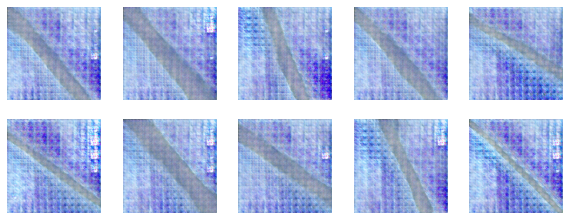

Epoch 391, Disc loss 0.0030399838084550317, Generator loss 5.361821509244149
Epoch 392, Disc loss 0.0018287818846320562, Generator loss 1.424545424810627
Epoch 393, Disc loss 0.002108622707830009, Generator loss 0.0467971097606463
Epoch 394, Disc loss 0.00320043947106157, Generator loss 1.0284172169136072
Epoch 395, Disc loss 0.09846233232369658, Generator loss 4.905766376277857
Epoch 396, Disc loss 0.30262361490269796, Generator loss 3.0574011091600384
Epoch 397, Disc loss 0.1239030994636363, Generator loss 3.7473600454497755
Epoch 398, Disc loss 0.2648916705613629, Generator loss 3.6577154899898328
Epoch 399, Disc loss 0.23828459750828251, Generator loss 2.5785641021895827
Epoch 400, Disc loss 0.030064746137947997, Generator loss 3.704128152445743


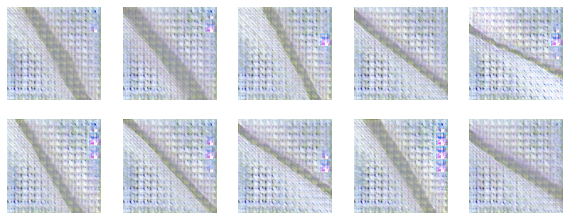

Epoch 401, Disc loss 0.008603843765065152, Generator loss 4.929011846843519
Epoch 402, Disc loss 0.010065334617497791, Generator loss 5.142190456390381
Epoch 403, Disc loss 0.5673069241240742, Generator loss 6.155695614061858
Epoch 404, Disc loss 0.2267194347705778, Generator loss 2.860913618876223
Epoch 405, Disc loss 0.14038863255063716, Generator loss 3.2828328776777838
Epoch 406, Disc loss 0.00931245594663681, Generator loss 4.7594967892295434
Epoch 407, Disc loss 0.005538469943175551, Generator loss 5.233944574991862
Epoch 408, Disc loss 0.0016940780305093948, Generator loss 0.853874729260018
Epoch 409, Disc loss 0.02861125200666701, Generator loss 4.256061134271715
Epoch 410, Disc loss 0.0011978069985810358, Generator loss 2.6220641194336247


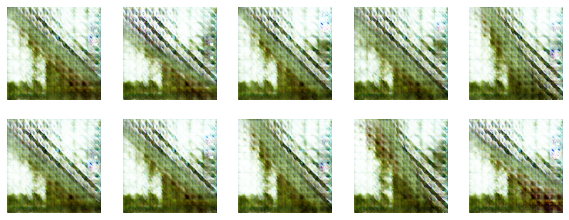

Epoch 411, Disc loss 0.022426751135868058, Generator loss 4.281561356364635
Epoch 412, Disc loss 0.0393121734043351, Generator loss 2.7579468206355444
Epoch 413, Disc loss 0.0014446625965389022, Generator loss 5.680219825945403
Epoch 414, Disc loss 0.000602939702419256, Generator loss 6.859835306803386
Epoch 415, Disc loss 0.0008692761889243766, Generator loss 4.044093236425205
Epoch 416, Disc loss 0.0004420476555364891, Generator loss 0.027044350787866534
Epoch 417, Disc loss 0.0005142496748683619, Generator loss 0.027030520471989325
Epoch 418, Disc loss 2.60276308191489, Generator loss 10.808783726164624
Epoch 419, Disc loss 0.04790634930533857, Generator loss 0.04289647320870326
Epoch 420, Disc loss 0.5209440813134683, Generator loss 3.5712593840677678


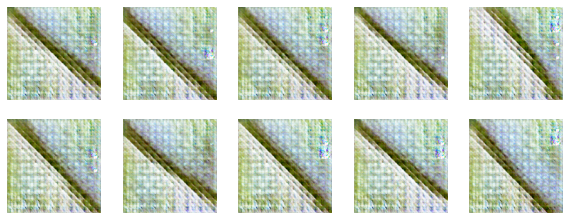

Epoch 421, Disc loss 0.23680377432569993, Generator loss 3.0182915152164926
Epoch 422, Disc loss 0.2869241423578116, Generator loss 2.5397312933938547
Epoch 423, Disc loss 0.33649268743925187, Generator loss 1.6756598688008493
Epoch 424, Disc loss 0.31901250836968403, Generator loss 1.6156712331269916
Epoch 425, Disc loss 0.29203897636187703, Generator loss 2.3119311207219173
Epoch 426, Disc loss 0.22571427146332307, Generator loss 2.252501813988937
Epoch 427, Disc loss 0.14859092964948023, Generator loss 2.844175359659028
Epoch 428, Disc loss 0.004599544753481497, Generator loss 2.7396320073228133
Epoch 429, Disc loss 0.009998976228246303, Generator loss 6.492218567613969
Epoch 430, Disc loss 0.006618369001461438, Generator loss 2.521657747665845


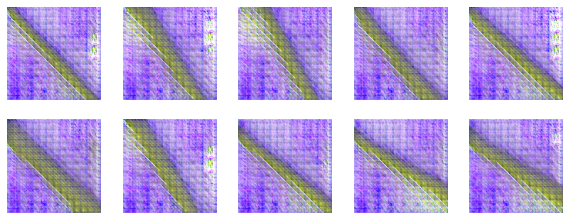

Epoch 431, Disc loss 0.058502508838046634, Generator loss 0.6618381691524726
Epoch 432, Disc loss 0.019046411519379865, Generator loss 0.25705198039251725
Epoch 433, Disc loss 0.2789222081864864, Generator loss 3.720321581290479
Epoch 434, Disc loss 0.05588577978339041, Generator loss 3.781506893927591
Epoch 435, Disc loss 0.002959777655365545, Generator loss 5.479788177891781
Epoch 436, Disc loss 0.003322975045037198, Generator loss 5.964319421533952
Epoch 437, Disc loss 0.0008834718930787009, Generator loss 5.872493183403685
Epoch 438, Disc loss 0.003764034639599839, Generator loss 0.6056266554647631
Epoch 439, Disc loss 0.0020172992812713657, Generator loss 0.06047033634151153
Epoch 440, Disc loss 0.061602300766598034, Generator loss 4.063552150894937


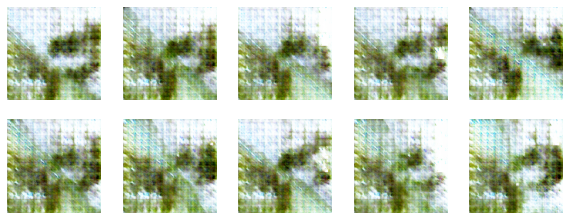

Epoch 441, Disc loss 0.036776214116339856, Generator loss 5.114149645755165
Epoch 442, Disc loss 0.002848792500884687, Generator loss 5.535160650286758
Epoch 443, Disc loss 0.024489187220914234, Generator loss 6.608539677502816
Epoch 444, Disc loss 0.07022082720296247, Generator loss 8.820816277281233
Epoch 445, Disc loss 0.02375257138183741, Generator loss 6.1574032808605
Epoch 446, Disc loss 0.029619920047824502, Generator loss 6.914113931488573
Epoch 447, Disc loss 0.17842777684715208, Generator loss 5.814524619202865
Epoch 448, Disc loss 0.10254004482178983, Generator loss 4.369539455363625
Epoch 449, Disc loss 0.3239901569690367, Generator loss 4.21456668643575
Epoch 450, Disc loss 0.006610388941310442, Generator loss 4.797557261952183


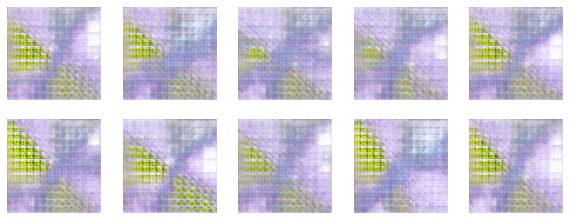

Epoch 451, Disc loss 0.012931927285049277, Generator loss 6.802002245919747
Epoch 452, Disc loss 0.009228495076498757, Generator loss 5.260465488752775
Epoch 453, Disc loss 0.0009811330833713943, Generator loss 0.1360571528539846
Epoch 454, Disc loss 0.07657159774246446, Generator loss 2.833783775657873
Epoch 455, Disc loss 0.009595620165148314, Generator loss 0.2698070429298177
Epoch 456, Disc loss 0.04290721561599352, Generator loss 4.510161124823386
Epoch 457, Disc loss 0.0022741350796076443, Generator loss 6.170211047456975
Epoch 458, Disc loss 0.02141386863366696, Generator loss 5.761815401545742
Epoch 459, Disc loss 0.0208557795745461, Generator loss 1.3605078160109227
Epoch 460, Disc loss 0.10289890316212573, Generator loss 2.12376481634483


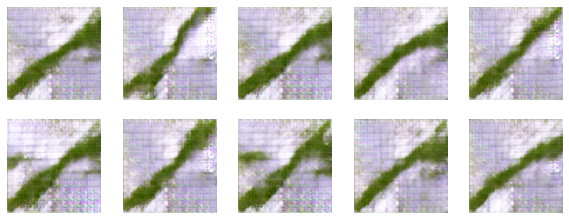

Epoch 461, Disc loss 0.09046664916350583, Generator loss 2.536609946112884
Epoch 462, Disc loss 0.06323493163152108, Generator loss 3.856054090616996
Epoch 463, Disc loss 0.052348145369797636, Generator loss 5.564597656852321
Epoch 464, Disc loss 0.07127417584992027, Generator loss 5.6302724428344195
Epoch 465, Disc loss 0.10471970511879088, Generator loss 5.155087822361996
Epoch 466, Disc loss 0.0670984972675637, Generator loss 5.22091267401712
Epoch 467, Disc loss 0.1099170510418118, Generator loss 5.041439872038992
Epoch 468, Disc loss 0.1320584798171726, Generator loss 4.101393415216814
Epoch 469, Disc loss 0.10872858241146675, Generator loss 4.6966291352322225
Epoch 470, Disc loss 0.11261895949436812, Generator loss 4.428035083569978


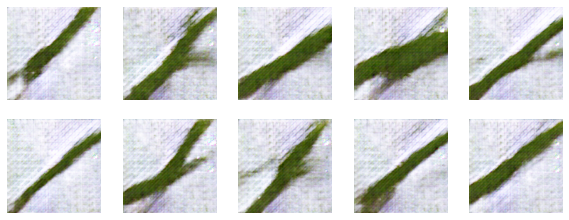

Epoch 471, Disc loss 0.12866574359885122, Generator loss 4.858335055802998
Epoch 472, Disc loss 0.08814754390162231, Generator loss 4.365279741454542
Epoch 473, Disc loss 0.10610879703761618, Generator loss 4.625638355288589
Epoch 474, Disc loss 0.07278290994582405, Generator loss 4.965879143330088
Epoch 475, Disc loss 0.0857466502393265, Generator loss 5.069743955344484
Epoch 476, Disc loss 0.08947601975614418, Generator loss 5.045106268765633
Epoch 477, Disc loss 0.08923718169002495, Generator loss 5.36872496939542
Epoch 478, Disc loss 0.09622563503491632, Generator loss 4.948104845850091
Epoch 479, Disc loss 0.07235964548950531, Generator loss 4.883867452019139
Epoch 480, Disc loss 0.15936786779552917, Generator loss 5.259006320384511


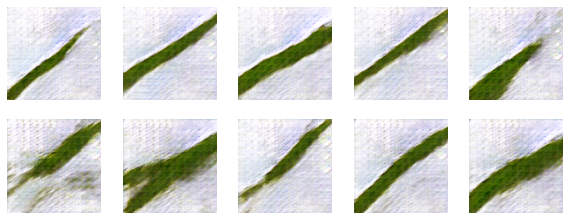

Epoch 481, Disc loss 0.22848376096963444, Generator loss 3.9254661568424156
Epoch 482, Disc loss 0.13361338951766977, Generator loss 3.8039026678654184
Epoch 483, Disc loss 0.09532884181217134, Generator loss 4.440506412271867
Epoch 484, Disc loss 0.10161280078858781, Generator loss 4.492983006594474
Epoch 485, Disc loss 1.844879403876308, Generator loss 4.706675343313499
Epoch 486, Disc loss 0.1442912967016888, Generator loss 5.702415460034421
Epoch 487, Disc loss 0.055939463033498386, Generator loss 1.4071417633901562
Epoch 488, Disc loss 0.1683787412665674, Generator loss 5.8284709484953625
Epoch 489, Disc loss 0.11325001190122046, Generator loss 4.625407239847016
Epoch 490, Disc loss 0.16516190974146394, Generator loss 4.2368739655143335


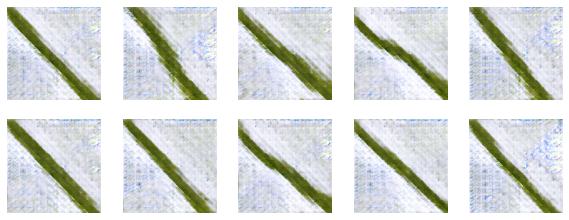

Epoch 491, Disc loss 0.18386520286999017, Generator loss 3.0252371817304375
Epoch 492, Disc loss 0.21582115632318483, Generator loss 2.8339374713730394
Epoch 493, Disc loss 0.16027295884416895, Generator loss 3.0778850818935193
Epoch 494, Disc loss 0.16693972838172494, Generator loss 3.099907109611913
Epoch 495, Disc loss 0.18337066268564708, Generator loss 3.5352937547784102
Epoch 496, Disc loss 0.17732754191424566, Generator loss 3.4535715747297857
Epoch 497, Disc loss 0.19585953881196155, Generator loss 3.3518712081407247
Epoch 498, Disc loss 0.1819766784292848, Generator loss 3.4208775277723347
Epoch 499, Disc loss 0.19965394086172814, Generator loss 3.3647461606745135
Epoch 500, Disc loss 0.1943014883650712, Generator loss 3.5935026553639196


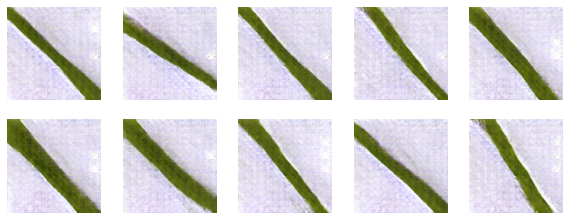

Epoch 501, Disc loss 0.20205803839283026, Generator loss 3.344161769800019
Epoch 502, Disc loss 0.17653685127662724, Generator loss 3.598813305821335
Epoch 503, Disc loss 0.20206590653642229, Generator loss 3.789622093501844
Epoch 504, Disc loss 0.16998539642244986, Generator loss 3.8936286558184707
Epoch 505, Disc loss 0.19559960958423817, Generator loss 3.719087579794097
Epoch 506, Disc loss 0.20408234794893743, Generator loss 3.635756630646555
Epoch 507, Disc loss 0.18103805436801754, Generator loss 3.6338816567471155
Epoch 508, Disc loss 0.12924538984774253, Generator loss 4.023770608400044
Epoch 509, Disc loss 0.17755535252702734, Generator loss 4.095553092789232
Epoch 510, Disc loss 0.18893126600928473, Generator loss 3.845199438563564


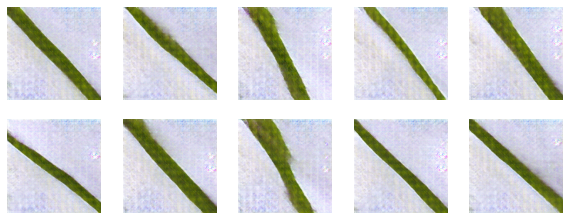

Epoch 511, Disc loss 0.14599508004316145, Generator loss 4.046894370463857
Epoch 512, Disc loss 0.1801814789559055, Generator loss 3.9434700681452166
Epoch 513, Disc loss 0.19161533636434525, Generator loss 3.7926185842145954
Epoch 514, Disc loss 0.18318196723499058, Generator loss 3.8061155812782155
Epoch 515, Disc loss 0.24527814369567, Generator loss 3.5783414882526063
Epoch 516, Disc loss 0.1912886227987576, Generator loss 3.5711366962968256
Epoch 517, Disc loss 0.1876254014572815, Generator loss 3.6604913117592797
Epoch 518, Disc loss 0.17288693449901124, Generator loss 3.770770938772904
Epoch 519, Disc loss 0.1541429903243848, Generator loss 3.74063171420181
Epoch 520, Disc loss 0.19675106076490984, Generator loss 3.7724373758884897


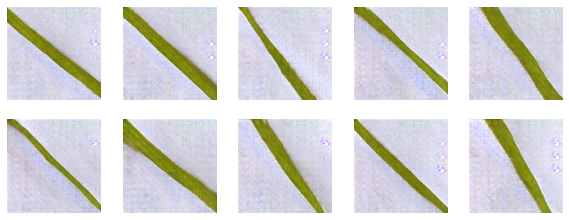

Epoch 521, Disc loss 0.17801075002276584, Generator loss 3.4147268094514547
Epoch 522, Disc loss 0.17443428003931777, Generator loss 3.4699180920918784
Epoch 523, Disc loss 0.13738286233172148, Generator loss 4.113644206733034
Epoch 524, Disc loss 0.166722402218862, Generator loss 3.7412146183482387
Epoch 525, Disc loss 0.11103273910620166, Generator loss 3.9529576678025093
Epoch 526, Disc loss 0.176609368045894, Generator loss 3.96674552925846
Epoch 527, Disc loss 0.19402740773001456, Generator loss 3.5765418462585985
Epoch 528, Disc loss 0.44659610894650403, Generator loss 4.324259678522746
Epoch 529, Disc loss 0.01671082487721923, Generator loss 4.865571807873876
Epoch 530, Disc loss 0.07656160875029128, Generator loss 2.6880070233488813


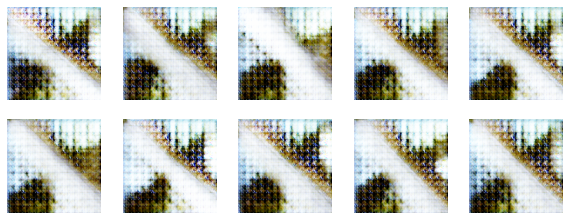

Epoch 531, Disc loss 0.0199817415563803, Generator loss 5.324146768503022
Epoch 532, Disc loss 0.008632714930551032, Generator loss 5.086797843899643
Epoch 533, Disc loss 0.13792405049182038, Generator loss 6.806972662607829
Epoch 534, Disc loss 0.09606288829169524, Generator loss 5.570852660296256
Epoch 535, Disc loss 0.07661865236558808, Generator loss 3.8594907877738014
Epoch 536, Disc loss 0.13497403016495418, Generator loss 3.0028305670671296
Epoch 537, Disc loss 0.08668821536774997, Generator loss 2.565176844596863
Epoch 538, Disc loss 0.12471566630928894, Generator loss 4.489970232311048
Epoch 539, Disc loss 0.21055235110096665, Generator loss 3.4740430744070756
Epoch 540, Disc loss 0.19151942975402467, Generator loss 3.2215130245476438


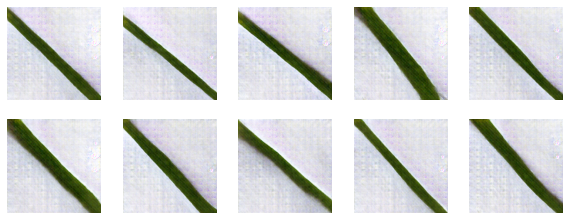

Epoch 541, Disc loss 0.1799039539141711, Generator loss 3.3572956783729686
Epoch 542, Disc loss 0.19447468829917183, Generator loss 3.4542596131040337
Epoch 543, Disc loss 0.27898093913360134, Generator loss 3.6877348046553764
Epoch 544, Disc loss 0.21092864883936718, Generator loss 3.1549770162816633
Epoch 545, Disc loss 0.16400086941634764, Generator loss 3.7287653914669106
Epoch 546, Disc loss 0.20187089082033358, Generator loss 3.0521398510849265
Epoch 547, Disc loss 0.18291378161142857, Generator loss 3.35796736834342
Epoch 548, Disc loss 0.11635320961168442, Generator loss 3.6237297978317526
Epoch 549, Disc loss 0.0060778164058356305, Generator loss 4.664112513525444
Epoch 550, Disc loss 0.0030704217814306353, Generator loss 5.583910180811296


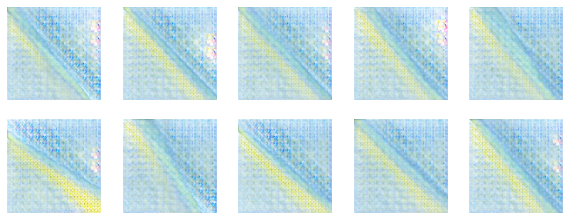

Epoch 551, Disc loss 0.0016912072709404033, Generator loss 6.398901245050263
Epoch 552, Disc loss 0.0014309861725308294, Generator loss 5.173683995740456
Epoch 553, Disc loss 0.012646449649056018, Generator loss 3.423488876014425
Epoch 554, Disc loss 0.043763061314492396, Generator loss 6.054560000436348
Epoch 555, Disc loss 0.011414403865320048, Generator loss 5.794165289192869
Epoch 556, Disc loss 0.04046884111071535, Generator loss 6.202482357359769
Epoch 557, Disc loss 0.6417083408238488, Generator loss 13.018189808517171
Epoch 558, Disc loss 0.38865690982046536, Generator loss 6.972457455023182
Epoch 559, Disc loss 0.2283441985941701, Generator loss 3.557398241862916
Epoch 560, Disc loss 0.1770253814935578, Generator loss 1.4384194664787828


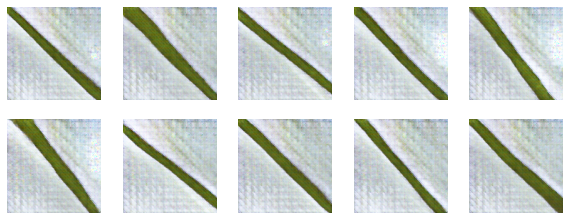

Epoch 561, Disc loss 0.1697700632676858, Generator loss 1.3141684498180424


KeyboardInterrupt: 

In [14]:
TOTAL_EPOCHS = 1000
## Training Loop

d_losses = []
g_losses = []

for epoch in range(TOTAL_EPOCHS):
    epoch_d_loss = 0.0
    epoch_g_loss = 0.0
    
    # Mini batch gradient decent
    
    for step in range(NO_OF_BATCHES-1):
        
        #+++++++++++++++++++++++
        # Step 1 Train Descriminator
        discriminator.trainable = True
        
        
        # get the real data
        idx = np.random.randint(0, BATCH_SIZE, HALF_BATCH)
        real_imgs = dataset[step][idx]
        
        # get the fake data
        noise = np.random.normal(0,1,size=(HALF_BATCH, NOISE_DIM))
        fake_imgs = generator.predict(noise)
        
        # Labels
#         real_y = np.ones((HALF_BATCH, 1)) * 0.9
        real_y = np.ones((HALF_BATCH, 1))
        fake_y = np.zeros((HALF_BATCH, 1))
        
        # Train Descriminator
        d_loss_real, _ = discriminator.train_on_batch(real_imgs, real_y)
        d_loss_fake, _ = discriminator.train_on_batch(fake_imgs, fake_y)
        
        d_loss = 0.5*d_loss_real + 0.5*d_loss_fake
        
        epoch_d_loss += d_loss
        
        #=====================================
        
        # Step 2 train Generator
        discriminator.trainable = False
        
        noise = np.random.normal(0,1,size=(BATCH_SIZE, NOISE_DIM))
        
        ground_truth_y = np.ones((BATCH_SIZE, 1))
        
        g_loss, _ = model.train_on_batch(noise, ground_truth_y)
        
        epoch_g_loss += g_loss
        
#         print(f"Epoch {epoch+1}, Batch {step+1} Disc loss {epoch_d_loss/NO_OF_BATCHES}, Generator loss {epoch_g_loss/NO_OF_BATCHES}")
        
#         d_losses.append(epoch_d_loss/NO_OF_BATCHES)
#         g_losses.append(epoch_g_loss/NO_OF_BATCHES)
        
#         if (epoch+1)%10 == 0:
#             generator.save("generator_epoch_" +  str(epoch+1) +".h5")
#             display_images()
    print(f"Epoch {epoch+1}, Disc loss {epoch_d_loss/(NO_OF_BATCHES-1)}, Generator loss {epoch_g_loss/(NO_OF_BATCHES-1)}")
        
    d_losses.append(epoch_d_loss/NO_OF_BATCHES)
    g_losses.append(epoch_g_loss/NO_OF_BATCHES)

    if (epoch+1)%10 == 0:
        generator.save("generator_epoch_" +  str(epoch+1) +".h5")
        display_images()
    

In [ ]:
import os
len(os.listdir("/kaggle/working/"))
# os.listdir("/kaggle/working/")[0]

In [16]:
# from zipfile import ZipFile
# # create a ZipFile object
# zipObj = ZipFile('sample.zip', 'w')
# for file in os.listdir("/kaggle/working/"):
#     # Add multiple files to the zip
#     zipObj.write(file)
# zipObj.close()


RuntimeError: File size unexpectedly exceeded ZIP64 limit

In [7]:
from keras.models import load_model

test_gan = load_model('/kaggle/working/generator_epoch_440.h5') 

In [9]:
noise = np.random.normal(0,1,size=(200, 100))
    
generated_img = test_gan.predict(noise)

2022-12-10 06:10:56.101223: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-12-10 06:10:58.104435: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


-0.9998143 1.0
9.286404e-05 1.0
0 255
0 255


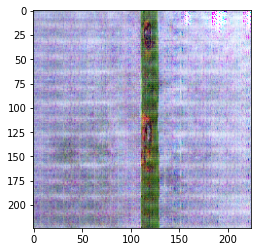

In [10]:

print(generated_img[0].min(), generated_img[0].max())
plt.imshow(generated_img[0])
generated_img_2 = (generated_img + 1) / 2.0
print(generated_img_2[0].min(), generated_img_2[0].max())
import numpy as np
generated_img_3 = (generated_img*255).astype(np.uint8)
print(generated_img_3[0].min(), generated_img_3[0].max())

generated_img_4 = (generated_img_2*255).astype(np.uint8)
print(generated_img_4[0].min(), generated_img_4[0].max())

In [ ]:
# !mkdir imgs

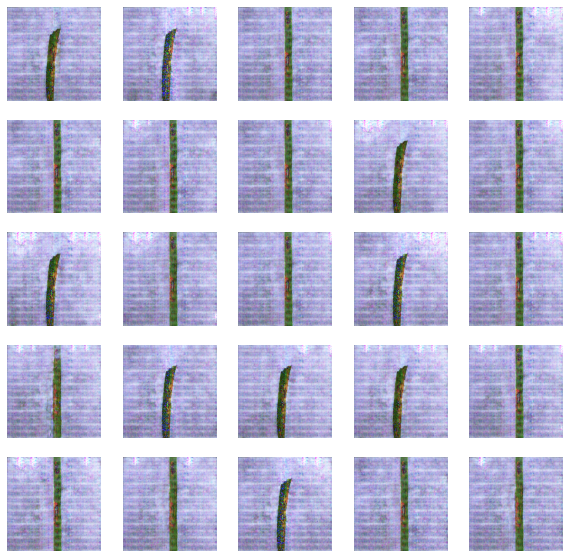

In [13]:
NOISE_DIM = 100
noise = np.random.normal(0,1,size=(100, NOISE_DIM))
    
generated_img = test_gan.predict(noise)

plt.figure(figsize = (10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    img = (generated_img[i]*255).astype(np.uint8)
    plt.imshow(img)
    plt.axis('off')
#     plt.imsave('/kaggle/working/imgs/' + str(i) + '.jpg', img)

plt.show()

In [ ]:
plt.figure(figsize = (10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
#     img = (generated_img[i]*255).astype(np.uint8)
    plt.imshow(generated_img[i])
    plt.axis('off')

plt.show()

In [ ]:
pwd

In [ ]:
for folderName, subfolders, filenames in os.walk(dirName):
    for filename in filenames:
       #create complete filepath of file in directory
        filePath = os.path.join(folderName, filename)
        print(filePath)
        break

In [ ]:
len(os.listdir('/kaggle/working'))

In [ ]:
# from zipfile import ZipFile
# import os
# from os.path import basename

# dirName = '/kaggle/working/'
# # create a ZipFile object
# with ZipFile('sampleDir.zip', 'w') as zipObj:
#    # Iterate over all the files in directory
#     for folderName, subfolders, filenames in os.walk(dirName):
#         for filename in filenames:
#            #create complete filepath of file in directory
#             filePath = os.path.join(folderName, filename)
#            # Add file to zip
#             zipObj.write(filePath, basename(filePath))

In [17]:
# os.remove('/kaggle/working/sample.zip')

In [ ]:
len(generated_img)

In [ ]:
noise = np.random.normal(0,1,size=(200, NOISE_DIM))
    
generated_img = generator.predict(noise)
print(generated_img[0].min(), generated_img[0].max())
plt.imshow(generated_img[0])
# generated_img = (generated_img + 1) / 2.0
# print(generated_img[0].min(), generated_img[0].max())
import numpy as np
generated_img = (generated_img*255).astype(np.uint8)
print(generated_img[0].min(), generated_img[0].max())

In [ ]:
plt.imshow(generated_img[0])

In [ ]:
print(generated_img[0].min())
generated_img[0].max()

In [ ]:
plt.imshow(generated_img[0])

In [ ]:
len(generated_img)

In [ ]:
NO_OF_BATCHES

In [ ]:
idx

In [ ]:
d_loss_fake

In [ ]:
tmp_path = "/kaggle/input/rice-diseases-leaf-blast-classification/Rice Diseases (Leaf Blast Classification)/Rice Diseases (Leaf Blast Classification)/test/"

def load_real_images():
    datagen = ImageDataGenerator(rescale=1./255)
    X = datagen.flow_from_directory(tmp_path,
                                    target_size= (128,128),
                                    batch_size=32,
                                    class_mode='binary')
    data_list = []
    batch_index = 0
    while batch_index <= X.batch_index:
        data = X.next()
        data_list.append(data[0])
        batch_index += 1
    img_array = np.asarray(data_list)
    return img_array

In [ ]:
dataset=load_real_images()

In [ ]:
pwd

In [ ]:
np.shape(dataset[0])

In [ ]:
871//32

In [ ]:
len(dataset[1][0])

In [ ]:
len(dataset[0])

In [ ]:
datagen = ImageDataGenerator(rescale=1./255)
tmp = datagen.flow_from_directory(tmp_path,
                                    target_size= (128,128),
                                    batch_size=32,
                                    class_mode='binary')

In [ ]:
x = tmp.next()

In [ ]:
x[1]

In [ ]:
tmp

In [ ]:
len(os.listdir("/kaggle/input/rice-diseases-leaf-blast-classification/Rice Diseases (Leaf Blast Classification)/Rice Diseases (Leaf Blast Classification)/test/Browon Spot/"))/32

In [ ]:
def generate_real_images(dataset, n_samples=32):
    i = np.random.randint(0, dataset.shape[0], n_samples)
    X = dataset[i]
    y = np.ones((n_samples,1))
    return X, y

In [ ]:
x, y = generate_real_images(dataset[0])

In [ ]:
i = np.random.randint(0, dataset[0].shape[0], 32)
i

In [ ]:
x = dataset[0][i]
len(x)

In [ ]:
len(dataset)

In [ ]:
len(dataset[0][0])

In [ ]:
X_real, y_real = generate_real_images(dataset, half_batch)

In [ ]:
class CustomDataGen(tf.keras.utils.Sequence):
    
    def __init__(self, df, X_col, y_col,
                 batch_size,
                 img_size=(224, 224, 3),
                 shuffle=True):
        
        self.df = df.copy()
        self.X_col = X_col
        self.y_col = y_col
        self.batch_size = batch_size
        self.img_size = img_size
        self.shuffle = shuffle
        
        self.n = len(self.df)
        self.on_epoch_end()
    
    def on_epoch_end(self):
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)
    
    def __get_input(self, path, target_size):

        image = tf.keras.preprocessing.image.load_img(path, target_size=target_size)
        image_arr = tf.keras.preprocessing.image.img_to_array(image)

        return image_arr/255.
    
    def __get_output(self, label):
        return label
    
    def __get_data(self, batches):
        # Generates data containing batch_size samples
        
        path_batch = batches[self.X_col['path']]
        
        label_batch = batches[self.y_col['label']]
        
        X_batch = np.asarray([self.__get_input4(x, self.img_size) for x in path_batch])
        
        y_batch = np.asarray([self.__get_output(y) for y in label_batch])

        return X_batch, y_batch.reshape(-1,1)
    
    def __getitem__(self, index):
        
        batches = self.df[index * self.batch_size:(index + 1) * self.batch_size]
        X, y = self.__get_data(batches)        
        return X, y
    
    def __len__(self):
        return self.n // self.batch_size


## tmp 3

In [ ]:
import numpy as np
import cv2
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img 
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, SeparableConv2D, MaxPooling2D, Lambda
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.layers import Conv2DTranspose, Conv2D, add, concatenate
from tensorflow.keras.layers import LeakyReLU, Activation, Reshape
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam 
from tensorflow.keras.callbacks import ModelCheckpoint,ReduceLROnPlateau


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os


In [ ]:
from tensorflow.keras.datasets.mnist import load_data

# load the images into memory
(trainX, trainy), (testX, testy) = load_data()

# summarize the shape of the dataset
print('Train', trainX.shape, trainy.shape)
print('Test', testX.shape, testy.shape)



In [ ]:
X_train = trainX/255

In [ ]:
X_train[0].shape

In [ ]:
X_train = np.expand_dims(X_train, axis=3)
X_train[0].shape

In [ ]:
plt.imshow(X_train[0])

In [ ]:
TOTAL_EPOCHS = 50
BATCH_SIZE = 1024
HALF_BATCH = BATCH_SIZE//2

NO_OF_BATCHES = int(X_train.shape[0]/BATCH_SIZE)
# NO_OF_BATCHES = len(dataset)
NOISE_DIM = 100

adam = keras.optimizers.Adam(learning_rate=2e-4, beta_1 = 0.5)

In [ ]:
# Generator Model : Upsampling

generator = keras.Sequential()
generator.add(layers.Dense(units=7*7*128, input_shape=(NOISE_DIM,)))
generator.add(Reshape((7,7,128)))
generator.add(layers.LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())

# (7,7,128) -> (14,14,64)
generator.add(layers.Conv2DTranspose(64, kernel_size=(3,3), strides=(2,2), padding="same"))
generator.add(layers.LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())


generator.add(layers.Conv2DTranspose(1, kernel_size=(3,3), strides=(2,2), padding="same", activation='tanh'))

# generator.compile(loss=keras.losses.BinaryCrossentropy(), optimizer=adam, metrics=['accuracy'])

generator.summary()

In [ ]:
# Discriminator Model -> Down Sampling
discriminator = keras.Sequential()
discriminator.add(layers.Conv2D(64, kernel_size=(3,3), strides=(2,2), padding="same", input_shape = (28, 28, 1)))
discriminator.add(layers.LeakyReLU(alpha=0.2))
# generator.add(BatchNormalization())

discriminator.add(layers.Conv2D(128, kernel_size=(3,3), strides=(2,2), padding="same"))
discriminator.add(layers.LeakyReLU(alpha=0.2))


discriminator.add(layers.Flatten())
discriminator.add(layers.Dense(100))
discriminator.add(layers.LeakyReLU(alpha=0.2))
discriminator.add(layers.Dense(1, activation="sigmoid"))

discriminator.compile(loss=keras.losses.BinaryCrossentropy(), optimizer=adam, metrics=['accuracy'])

discriminator.summary()

In [ ]:
# Combined Model

discriminator.trainable = False
gan_input = Input(shape=(NOISE_DIM, ))
generated_img = generator(gan_input)
gan_output = discriminator(generated_img)

# Functional API

model = Model(gan_input, gan_output)
model.compile(loss=keras.losses.BinaryCrossentropy(), optimizer=adam, metrics=['accuracy'])
model.summary()

In [ ]:

def display_images(samples = 10):
    noise = np.random.normal(0,1,size=(HALF_BATCH, NOISE_DIM))
    
    generated_img = generator.predict(noise)
    
    plt.figure(figsize = (10,10))
    for i in range(samples):
        plt.subplot(5,5,i+1)
        plt.imshow(generated_img[i])
        plt.axis('off')
    
    plt.show()

In [ ]:
TOTAL_EPOCHS = 100
## Training Loop

d_losses = []
g_losses = []

for epoch in range(TOTAL_EPOCHS):
    epoch_d_loss = 0.0
    epoch_g_loss = 0.0
    
    # Mini batch gradient decent
    
    for step in range(NO_OF_BATCHES-1):
        
        #+++++++++++++++++++++++
        # Step 1 Train Descriminator
        discriminator.trainable = True
        
        
        # get the real data
        idx = np.random.randint(0, 60000, HALF_BATCH)
        real_imgs = X_train[idx]
        
        # get the fake data
        noise = np.random.normal(0,1,size=(HALF_BATCH, NOISE_DIM))
        fake_imgs = generator.predict(noise)
        
        # Labels
#         real_y = np.ones((HALF_BATCH, 1)) * 0.9
        real_y = np.ones((HALF_BATCH, 1))
        fake_y = np.zeros((HALF_BATCH, 1))
        
        # Train Descriminator
        d_loss_real, _ = discriminator.train_on_batch(real_imgs, real_y)
        d_loss_fake, _ = discriminator.train_on_batch(fake_imgs, fake_y)
        
        d_loss = 0.5*d_loss_real + 0.5*d_loss_fake
        
        epoch_d_loss += d_loss
        
        #=====================================
        
        # Step 2 train Generator
        discriminator.trainable = False
        
        noise = np.random.normal(0,1,size=(BATCH_SIZE, NOISE_DIM))
        
        ground_truth_y = np.ones((BATCH_SIZE, 1))
        
        g_loss, _ = model.train_on_batch(noise, ground_truth_y)
        
        epoch_g_loss += g_loss
        
#         print(f"Epoch {epoch+1}, Batch {step+1} Disc loss {epoch_d_loss/NO_OF_BATCHES}, Generator loss {epoch_g_loss/NO_OF_BATCHES}")
        
#         d_losses.append(epoch_d_loss/NO_OF_BATCHES)
#         g_losses.append(epoch_g_loss/NO_OF_BATCHES)
        
#         if (epoch+1)%10 == 0:
#             generator.save("generator_epoch_" +  str(epoch+1) +".h5")
#             display_images()
#         print(f"Epoch {epoch+1}, Disc loss {d_loss}, Generator loss {g_loss}")

#         d_losses.append(epoch_d_loss/NO_OF_BATCHES)
#         g_losses.append(epoch_g_loss/NO_OF_BATCHES)
        
    print(f"Epoch {epoch+1}, Disc loss {d_loss}, Generator loss {g_loss}")

    if (epoch+1)%10 == 0:
        generator.save("generator_epoch_" +  str(epoch+1) +".h5")
        display_images()

## tmp 4